In [18]:
import os
import math
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D, Input, BatchNormalization, LeakyReLU, Conv2D, MaxPooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers.experimental import AdamW
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
tf.random.set_seed(42)

In [51]:
class DataProcessor:
    def __init__(self, base_path):
        self.base_path = base_path
        self.image_size = (360, 360)
    
    def apply_augmentation(self, image, bbox):
        bbox = tf.cast(bbox, tf.float32)
        
        h, w = float(self.image_size[0]), float(self.image_size[1])
        bbox_pixel = bbox * tf.constant([w, h, w, h], dtype=tf.float32)
        
        if tf.random.uniform([]) > 0.5:
            image = tf.image.flip_left_right(image)
            bbox_pixel = tf.stack([
                w - bbox_pixel[2],
                bbox_pixel[1],    
                w - bbox_pixel[0], 
                bbox_pixel[3]      
            ])
        
        if tf.random.uniform([]) > 0.5:
            angle = tf.random.uniform([], minval=-15, maxval=15) * math.pi / 180
            image = tf.keras.layers.RandomRotation(
                factor=(-15/360, 15/360),
                fill_mode='constant',
                fill_value=1.0
            )(image)
            
            center_x = (bbox_pixel[0] + bbox_pixel[2]) / 2
            center_y = (bbox_pixel[1] + bbox_pixel[3]) / 2
            width = bbox_pixel[2] - bbox_pixel[0]
            height = bbox_pixel[3] - bbox_pixel[1]
            
            cos_theta = tf.cos(angle)
            sin_theta = tf.sin(angle)
            new_center_x = (center_x - w/2) * cos_theta - (center_y - h/2) * sin_theta + w/2
            new_center_y = (center_x - w/2) * sin_theta + (center_y - h/2) * cos_theta + h/2
            
            expansion_factor = 1.2
            new_width = width * expansion_factor
            new_height = height * expansion_factor
            
            bbox_pixel = tf.stack([
                tf.clip_by_value(new_center_x - new_width/2, 0, w),
                tf.clip_by_value(new_center_y - new_height/2, 0, h),
                tf.clip_by_value(new_center_x + new_width/2, 0, w),
                tf.clip_by_value(new_center_y + new_height/2, 0, h)
            ])
        
        if tf.random.uniform([]) > 0.5:
            zoom_factor = tf.random.uniform([], minval=0.9, maxval=1.0)
            image = tf.image.central_crop(image, zoom_factor)
            image = tf.image.resize(image, self.image_size)
            
            bbox_pixel = bbox_pixel * zoom_factor
            bbox_pixel = tf.clip_by_value(bbox_pixel, 0, tf.maximum(w, h))
        
        if tf.random.uniform([]) > 0.5:
            image = tf.image.random_brightness(image, 0.2)
            image = tf.image.random_contrast(image, 0.8, 1.2)
            image = tf.image.random_saturation(image, 0.8, 1.2)
            image = tf.image.random_hue(image, 0.1)
        
        if tf.random.uniform([]) > 0.5:
            noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=0.01)
            image = tf.clip_by_value(image + noise, 0.0, 1.0)
        
        bbox = bbox_pixel / tf.constant([w, h, w, h], dtype=tf.float32)
        return image, bbox

    def load_and_preprocess_image(self, filename, bbox):
        try:
            img = tf.io.read_file(filename)
            img = tf.image.decode_jpeg(img, channels=3)
            img = tf.image.resize(img, self.image_size)
            img = tf.cast(img, tf.float32) / 255.0
            
            img, bbox = self.apply_augmentation(img, bbox)
            
            return img, bbox
        except tf.errors.NotFoundError:
            tf.print(f"File not found: {filename}")
            return None, None
            
    def create_dataset(self, csv_file, base_dir, is_training=True, batch_size=16):
        df = pd.read_csv(csv_file)
            
        filenames = df['filename'].apply(lambda x: os.path.join(base_dir, x)).values
        
        bboxes = df[['xmin', 'ymin', 'xmax', 'ymax']].values.astype(np.float32)
        
        bboxes = bboxes / np.array([self.image_size[1], self.image_size[0], 
                                   self.image_size[1], self.image_size[0]], 
                                   dtype=np.float32)
        
        dataset = tf.data.Dataset.from_tensor_slices((filenames, bboxes))
        dataset = dataset.map(
            lambda f, b: (self.load_and_preprocess_image(f, b)),
            num_parallel_calls=tf.data.AUTOTUNE
        )
        dataset = dataset.filter(lambda x, y: x is not None)
        
        def prepare_data(img, bbox):
            return img, {'bbox_output': bbox}
        
        dataset = dataset.map(prepare_data)
        
        if is_training:
            dataset = dataset.shuffle(buffer_size=1000)
        
        dataset = dataset.batch(batch_size)
        dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
        
        return dataset


In [20]:

class VisionModel:
    def __init__(self):
        self.model = self._build_model()
        
    def _build_model(self):
        inputs = Input(shape=(360, 360, 3))
        
        base_model = base_model = VGG16(weights='imagenet', include_top=False, input_shape=(360, 360, 3))
        for layer in base_model.layers[:-4]:  # Freeze all layers except the last 4
            layer.trainable = False

        for layer in base_model.layers:
            if isinstance(layer, Conv2D):
                layer.kernel_initializer = tf.keras.initializers.HeNormal()
        
        x = base_model(inputs, training=True)
        
        def conv_block(x, filters):
            x = Conv2D(filters, (3, 3), padding='same', kernel_initializer='he_normal')(x)
            x = BatchNormalization()(x)
            x = LeakyReLU(alpha=0.1)(x)
            x = MaxPooling2D(pool_size=(2, 2))(x)
            return x
            
        x = conv_block(x, 64)
        x = conv_block(x, 128)
        
        x = GlobalAveragePooling2D()(x)
        
        def fc_block(x, units, dropout_rate=0.5):
            skip = x
            x = Dense(units)(x)
            x = BatchNormalization()(x)
            x = LeakyReLU(alpha=0.1)(x)
            x = Dropout(dropout_rate)(x)
            if skip.shape[-1] == units:
                x = x + skip
            return x
            
        x = fc_block(x, 512)
        x = fc_block(x, 256)
        #modify_test
        #x = fc_block(x, 128)
        #x = fc_block(x, 64)
        
        bbox_output = Dense(4, activation='sigmoid', name='bbox_output')(x)  
        
        model = Model(inputs=inputs, outputs=bbox_output)
        return model
        
    def compile_model(self, learning_rate=0.0001):
        optimizer = AdamW(
            learning_rate=learning_rate,
            weight_decay=0.0001,
            beta_1=0.9,
            beta_2=0.999,
            epsilon=1e-07
        )
        
        self.model.compile(
            optimizer=optimizer,
            loss={
                'bbox_output': 'huber' 
            },
            metrics={
                'bbox_output': ['mae', tf.keras.metrics.MeanSquaredError()]
            }
        )
    
    def get_callbacks(self, model_dir='model'):
        callbacks = [
            ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.5,
                patience=5,
                min_lr=1e-6,
                verbose=1
            ),
            EarlyStopping(
                monitor='val_loss',
                patience=10,
                restore_best_weights=True,
                verbose=1
            ),
            ModelCheckpoint(
                os.path.join(model_dir, 'model-{epoch:02d}-{val_loss:.2f}.keras'),
                monitor='val_loss',
                save_best_only=True,
                verbose=1,
                save_weights_only=False
            )
        ]
        return callbacks


In [21]:
def plot_metrics(history):
    plt.figure(figsize=(6, 5))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(loc='upper right')
    plt.show()


In [22]:

def train_model():
    base_path = 'dataset/'
    data_processor = DataProcessor(base_path)
    
    train_dataset = data_processor.create_dataset(
        os.path.join(base_path, 'train', '_annotations.csv'),
        os.path.join(base_path, 'train'),
        is_training=True
    )
    
    valid_dataset = data_processor.create_dataset(
        os.path.join(base_path, 'valid', '_annotations.csv'),
        os.path.join(base_path, 'valid'),
        is_training=False
    )
    
    model = VisionModel()
    model.compile_model()
    
    history = model.model.fit(
        train_dataset,
        epochs=100,
        validation_data=valid_dataset,
        callbacks=model.get_callbacks(),
        workers=4,
        use_multiprocessing=True
    )
    
    model_save_path = 'model/my_modelVgg16BB.h5'
    model.model.save(model_save_path)
    print(f'Model saved to: {model_save_path}')
    plot_metrics(history)
    return model, history, data_processor


Epoch 1/100
    200/Unknown - 793s 4s/step - loss: 0.0545 - mae: 0.2593 - mean_squared_error: 0.1091
Epoch 1: val_loss improved from inf to 0.03446, saving model to model\model-01-0.03.keras
200/200 [==============================] - 949s 5s/step - loss: 0.0545 - mae: 0.2593 - mean_squared_error: 0.1091 - val_loss: 0.0345 - val_mae: 0.1912 - val_mean_squared_error: 0.0689 - lr: 1.0000e-04
Epoch 2/100
200/200 [==============================] - ETA: 0s - loss: 0.0358 - mae: 0.2045 - mean_squared_error: 0.0716
Epoch 2: val_loss did not improve from 0.03446
200/200 [==============================] - 930s 5s/step - loss: 0.0358 - mae: 0.2045 - mean_squared_error: 0.0716 - val_loss: 0.0376 - val_mae: 0.2002 - val_mean_squared_error: 0.0753 - lr: 1.0000e-04
Epoch 3/100
200/200 [==============================] - ETA: 0s - loss: 0.0319 - mae: 0.1896 - mean_squared_error: 0.0639
Epoch 3: val_loss improved from 0.03446 to 0.03027, saving model to model\model-03-0.03.keras
200/200 [===============

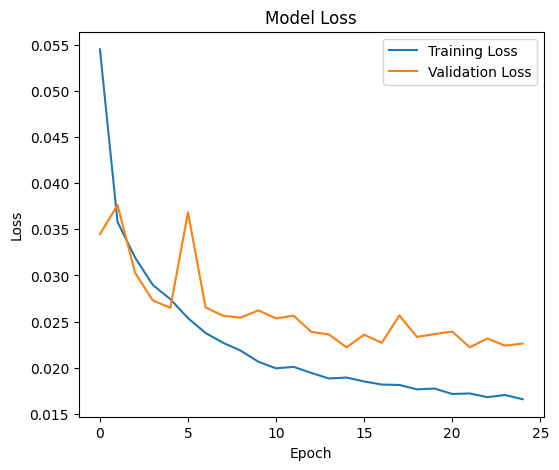

In [23]:
model, history, data_processor = train_model()

23/23 [==============================] - 74s 3s/step
Bounding Box MAE: 0.1519
Bounding Box MSE: 0.0390


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.011585474..1.0608692].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047449708..0.9448843].


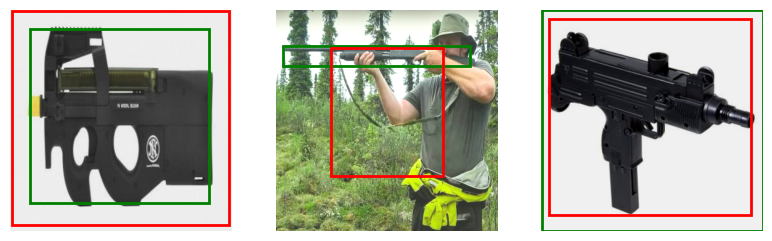

In [ ]:

test_dataset = data_processor.create_dataset(
        os.path.join('dataset', 'test', '_annotations.csv'),
        os.path.join('dataset', 'test'),
        is_training=False
    )

    # Predictions on test data
bbox_pred = model.model.predict(test_dataset)

    # Extract true class labels from test dataset
true_bboxes = []
for _, labels in test_dataset.unbatch():
    true_bboxes.append(labels['bbox_output'])

true_bboxes = np.array(true_bboxes)

mae = np.mean(np.abs(true_bboxes - bbox_pred))
mse = np.mean((true_bboxes - bbox_pred) ** 2)

print(f"Bounding Box MAE: {mae:.4f}")
print(f"Bounding Box MSE: {mse:.4f}")


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.20929751..1.0868285].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043795228..0.9448485].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.2065423..1.1521801].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1514022..0.9917525].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.014604561..1.1554337].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2137708..0.8649255].


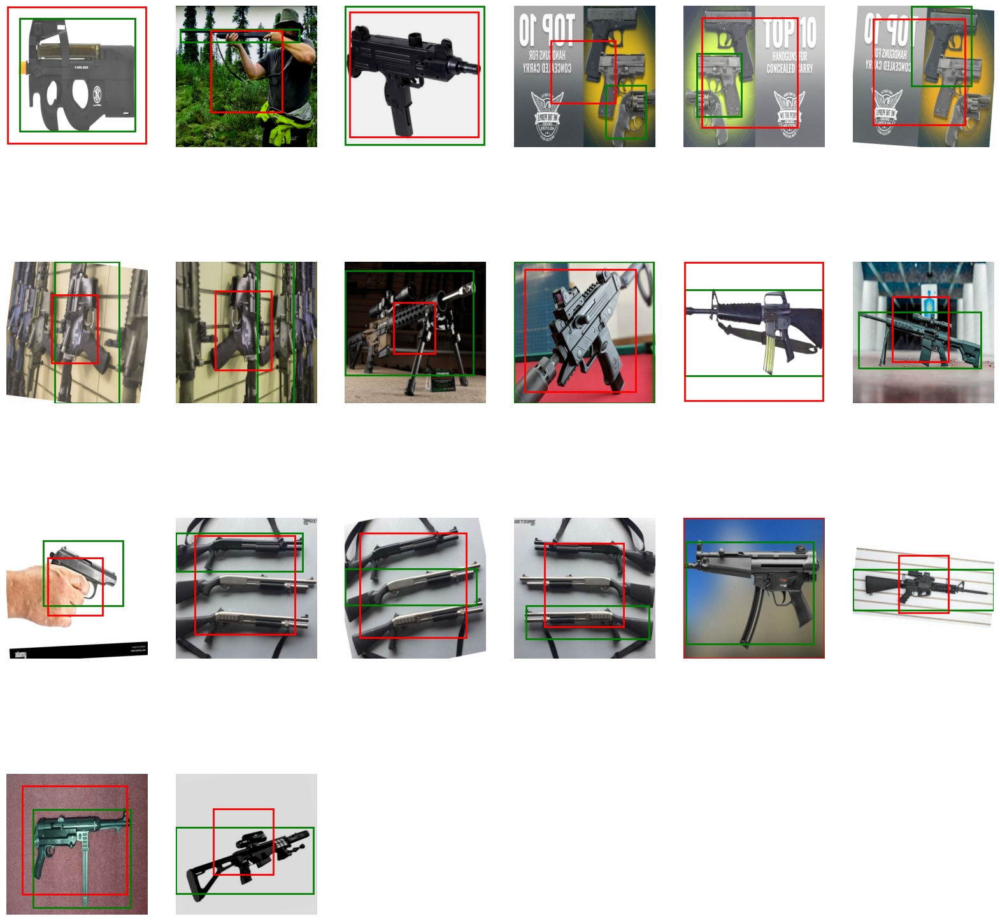

In [37]:

def visualize_predictions(test_dataset, bbox_preds, num_samples=5, images_per_row=6):
    sample_images = []
    sample_true_bboxes = []
    sample_pred_bboxes = []

    # Collect the sample images and bounding boxes
    for img, labels in test_dataset.unbatch().take(num_samples):
        sample_images.append(img.numpy())
        sample_true_bboxes.append(labels['bbox_output'].numpy())

    sample_pred_bboxes = bbox_preds[:num_samples]

    # Calculate number of rows for the grid layout
    num_rows = int(np.ceil(num_samples / images_per_row))
    
    # Create subplots
    fig, axes = plt.subplots(num_rows, images_per_row, figsize=(20, 5 * num_rows))
    axes = axes.flatten()  # Flatten to make it easier to index

    for i in range(num_samples):
        ax = axes[i]
        ax.imshow(sample_images[i])
        
        # True bounding box (Green)
        x_min, y_min, x_max, y_max = sample_true_bboxes[i]
        ax.add_patch(plt.Rectangle((x_min * 360, y_min * 360), (x_max - x_min) * 360, (y_max - y_min) * 360, edgecolor='g', linewidth=2, fill=False, label="True"))

        # Predicted bounding box (Red)
        x_min, y_min, x_max, y_max = sample_pred_bboxes[i]
        ax.add_patch(plt.Rectangle((x_min * 360, y_min * 360), (x_max - x_min) * 360, (y_max - y_min) * 360, edgecolor='r', linewidth=2, fill=False, label="Predicted"))

        ax.axis('off')

    # Remove any unused subplots
    for i in range(num_samples, len(axes)):
        fig.delaxes(axes[i])

    plt.show()

# Visualize predictions
visualize_predictions(test_dataset, bbox_pred, num_samples=20)


In [ ]:
def compute_iou(box1, box2):
    """Compute Intersection over Union (IoU) between two bounding boxes."""
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    # Compute intersection
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)

    inter_area = max(0, inter_x_max - inter_x_min) * max(0, inter_y_max - inter_y_min)

    # Compute union
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

def evaluate_model(test_dataset, model, iou_threshold=0.5):
    """Evaluate bounding box predictions using MAE, MSE, and IoU-based metrics."""
    bbox_preds = model.model.predict(test_dataset)

    true_bboxes = []
    for _, labels in test_dataset.unbatch():
        true_bboxes.append(labels['bbox_output'])

    true_bboxes = np.array(true_bboxes)

    # Compute MAE and MSE
    mae = np.mean(np.abs(true_bboxes - bbox_preds))
    mse = np.mean((true_bboxes - bbox_preds) ** 2)

    # Compute IoU scores
    ious = np.array([compute_iou(true_bboxes[i], bbox_preds[i]) for i in range(len(true_bboxes))])

    # IoU-based Precision, Recall, and F1-score
    tp = np.sum(ious >= iou_threshold)  # True Positives (IoU ≥ threshold)
    fp = np.sum(ious < iou_threshold)   # False Positives (IoU < threshold)
    fn = 0  # Since there's always one true box per image, we assume no missing detections

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0
    f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    # Print results
    print(f"Bounding Box MAE: {mae:.4f}")
    print(f"Bounding Box MSE: {mse:.4f}")
    print(f"Mean IoU: {np.mean(ious):.4f}")
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-score: {f1_score:.4f}")

    return {
        "MAE": mae,
        "MSE": mse,
        "Mean IoU": np.mean(ious),
        "Precision": precision,
        "Recall": recall,
        "F1-score": f1_score
    }

# Run evaluation
metrics = evaluate_model(test_dataset, model)


23/23 [==============================] - 80s 3s/step
Bounding Box MAE: 0.1538
Bounding Box MSE: 0.0396
Mean IoU: 0.3896
Precision: 0.2582
Recall: 1.0000
F1-score: 0.4105


## Updated upto above

In [31]:
results = model.model.evaluate(test_dataset)

# Unpack results correctly
test_loss, bbox_output_mae, bbox_output_mse = results  # Only bounding box metrics

# Print evaluation metrics
print(f'Test Loss: {test_loss:.4f}')
print(f'Bounding Box MAE: {bbox_output_mae:.4f}')
print(f'Bounding Box MSE: {bbox_output_mse:.4f}')

23/23 [==============================] - 77s 3s/step - loss: 0.0200 - mae: 0.1553 - mean_squared_error: 0.0400
Test Loss: 0.0200
Bounding Box MAE: 0.1553
Bounding Box MSE: 0.0400


In [48]:
from tensorflow.keras.models import load_model
model = load_model('model\my_modelVgg16BB.h5')

In [39]:
base_path = 'dataset/'
data_processor = DataProcessor(base_path)
test_dataset = data_processor.create_dataset(
    os.path.join(base_path, 'test', '_annotations.csv'),
    os.path.join(base_path, 'test'),
    is_training=False
)

y_pred = model.predict(test_dataset)
print(y_pred)

23/23 [==============================] - 81s 3s/step
[[0.00125444 0.00174479 0.9959669  0.991619  ]
 [0.26604292 0.21791226 0.7272134  0.74458665]
 [0.05018906 0.04658159 0.92766047 0.91776836]
 ...
 [0.4242281  0.393322   0.5650036  0.5346767 ]
 [0.42336038 0.39485878 0.5611515  0.533055  ]
 [0.412163   0.37816328 0.5777907  0.5549599 ]]


In [ ]:
def plot_image_with_boxes(image, pred_boxes, true_boxes=None):
    plt.figure(figsize=(3, 3))
    plt.imshow(image, cmap='gray')
    
    # Get image dimensions
    height, width = image.shape[:2]

    # Draw predicted box

    if pred_boxes is not None:
        # Extract the box from the nested array and denormalize coordinates
        box = pred_boxes[0]  # Get the first (and only) box
        x = box[0] * width
        y = box[1] * height
        w = box[2] * width
        h = box[3] * height
        
        plt.gca().add_patch(plt.Rectangle((x, y), w, h, 
                                        fill=False, 
                                        color='red', 
                                        linewidth=2,
                                        label='Predicted'))
    
    # Draw ground truth box
    if true_boxes is not None:
        # Extract the box from the nested array and denormalize coordinates
        box = true_boxes[0]  # Get the first (and only) box
        x = box[0] * width
        y = box[1] * height
        w = box[2] * width
        h = box[3] * height
        
        plt.gca().add_patch(plt.Rectangle((x, y), w, h, 
                                        fill=False, 
                                        color='green', 
                                        linewidth=2,
                                        label='Ground Truth'))
    
    plt.legend()
    plt.axis('on')
    plt.tight_layout()
    plt.show()

test_dataset_iter = iter(test_dataset)  
batch = next(test_dataset_iter)  

image = batch[0][0].numpy()  
true_boxes = batch[1]['bbox_output'][0].numpy()  

pred_boxes = model.predict(image[np.newaxis, ...])[1][0]  
print("Predicted boxes shape:", pred_boxes.shape)
print("True boxes shape:", true_boxes.shape)
print("Image shape:", image.shape)

num_images = 5 
for i, batch in enumerate(test_dataset.take(num_images)):
    
    image = batch[0][0].numpy()
    true_boxes = batch[1]['bbox_output'][0].numpy()
    
    pred_boxes = model.predict(image[np.newaxis, ...])[1][0]
    
    plot_image_with_boxes(image, [pred_boxes], [true_boxes])
    
    if i >= num_images - 1:
        break  

# single object plot bbox

1/1 [==============================] - 0s 468ms/step


IndexError: index 1 is out of bounds for axis 0 with size 1

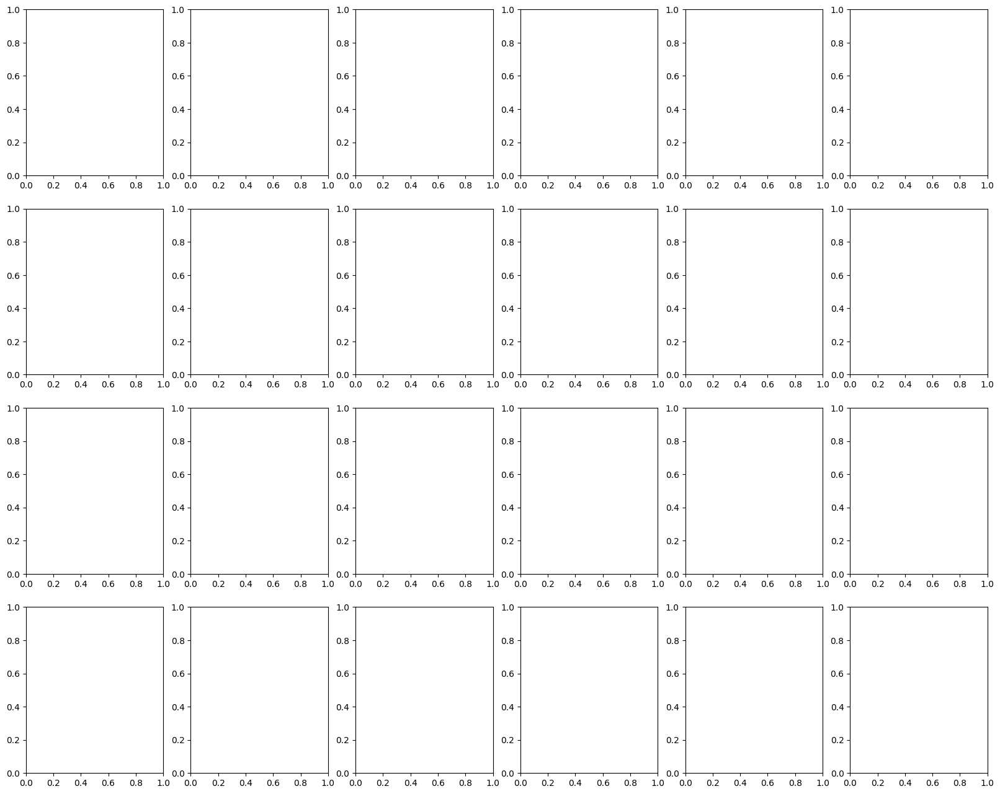

In [49]:
def plot_image_with_boxes(image, pred_boxes, true_boxes=None, ax=None):
    if ax is None:
        ax = plt.gca()
    
    ax.imshow(image, cmap='gray')
    
    height, width = image.shape[:2]
    
    if pred_boxes is not None:
        box = pred_boxes[0]
        x = box[0] * width
        y = box[1] * height
        w = box[2] * width
        h = box[3] * height
        
        ax.add_patch(plt.Rectangle((x, y), w, h, 
                                 fill=False, 
                                 color='red', 
                                 linewidth=2,
                                 label='Predicted'))
    
    if true_boxes is not None:
        box = true_boxes[0]
        x = box[0] * width
        y = box[1] * height
        w = box[2] * width
        h = box[3] * height
        
        ax.add_patch(plt.Rectangle((x, y), w, h, 
                                 fill=False, 
                                 color='green', 
                                 linewidth=2,
                                 label='Ground Truth'))
    
    ax.legend()

def plot_multiple_images(test_dataset, num_images, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(20, 4*rows))
    axes = axes.ravel() 
    
    for i, batch in enumerate(test_dataset.take(num_images)):
        if i >= num_images:
            break
            
        image = batch[0][0].numpy()
        true_boxes = batch[1]['bbox_output'][0].numpy()
        
        pred_boxes = model.predict(image[np.newaxis, ...])[1][0]
        
        plot_image_with_boxes(image, [pred_boxes], [true_boxes], ax=axes[i])
        axes[i].set_title(f'Image {i+1}')
    
    plt.tight_layout()
    plt.show()

num_images = 30  
rows = 4      
cols = 6        

plot_multiple_images(test_dataset, num_images, rows, cols)

Image: -0_jpg.rf.eecfb0dca2432f9d688bfcd064b9559b.jpg
Predicted Boxes (Raw): [0.3115905  0.23724148 0.6901872  0.70783114]
Bounding box found for -0_jpg.rf.eecfb0dca2432f9d688bfcd064b9559b.jpg: [array([0.3115905 , 0.23724148, 0.6901872 , 0.70783114], dtype=float32)]

Image 1: -0_jpg.rf.eecfb0dca2432f9d688bfcd064b9559b.jpg
Bounding Box: [array([0.3115905 , 0.23724148, 0.6901872 , 0.70783114], dtype=float32)]
--------------------------------------------------
Image: 0-66-500x500_jpg.rf.ea784198b65e9fecf6dc2d31e6ff44d2.jpg
Predicted Boxes (Raw): [0.06570321 0.06162442 0.9055085  0.8691121 ]
Bounding box found for 0-66-500x500_jpg.rf.ea784198b65e9fecf6dc2d31e6ff44d2.jpg: [array([0.06570321, 0.06162442, 0.9055085 , 0.8691121 ], dtype=float32)]

Image 2: 0-66-500x500_jpg.rf.ea784198b65e9fecf6dc2d31e6ff44d2.jpg
Bounding Box: [array([0.06570321, 0.06162442, 0.9055085 , 0.8691121 ], dtype=float32)]
--------------------------------------------------
Image: 001_0017_jpg.rf.ae278cb8e0cd2a71224bfbd

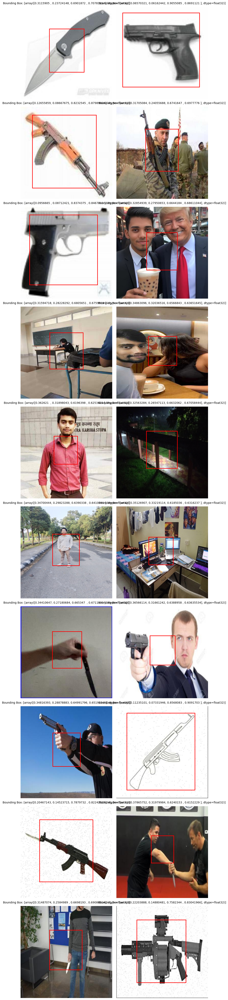

In [66]:
from tensorflow.keras.preprocessing import image as keras_image

def preprocess_image(img_path, model):
    # Load and preprocess the image to be compatible with model input shape
    img = keras_image.load_img(img_path, target_size=model.input_shape[1:3])
    img_array = keras_image.img_to_array(img)
    img_array = tf.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize to [0, 1]
    return img_array

def plot_image_with_boxes(ax, img_array, boxes):
    # Plot the image with bounding boxes
    ax.imshow(img_array)
    img_height, img_width = img_array.shape[:2]
    
    for box in boxes:
        xmin, ymin, xmax, ymax = box
        # If the box is normalized, denormalize it using image dimensions
        if xmin < 1 and ymin < 1 and xmax < 1 and ymax < 1:
            xmin, xmax = xmin * img_width, xmax * img_width
            ymin, ymax = ymin * img_height, ymax * img_height
        
        # Add the bounding box (red)
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   edgecolor='red', linewidth=2, fill=False))
    ax.axis('off')

def test_model_on_folder(folder_path, model, num_images=4, threshold=0.4):
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('png', 'jpg', 'jpeg'))]
    
    # Calculate number of rows needed (2 images per row)
    num_rows = (min(num_images, len(image_files)) + 1) // 2
    
    # Create a figure with subplots
    fig, axes = plt.subplots(num_rows, 2, figsize=(10, 5*num_rows))
    if num_rows == 1:
        axes = axes.reshape(1, -1)
    
    # Process each image
    for i, img_file in enumerate(image_files[:num_images]):
        if i >= num_images:
            break
            
        row = i // 2
        col = i % 2
        
        img_path = os.path.join(folder_path, img_file)
        img_array = preprocess_image(img_path, model)
        
        # Get predictions
        predictions = model.predict(img_array, verbose=0)  # Reduced verbosity
        
        # Check if the model returns bounding boxes only (no class probabilities)
        pred_boxes = predictions[0]  # Assuming the model returns bounding boxes
        
        # Debugging: Check the output of the model
        print(f"Image: {img_file}")
        print(f"Predicted Boxes (Raw): {pred_boxes}")
        
        # Apply threshold and determine if bounding box exists
        if np.max(pred_boxes) > threshold:  # If the box confidence is above the threshold
            pred_boxes = [pred_boxes]  # Valid box found, list for consistency
        else:
            pred_boxes = []  # No valid box
        
        # Debugging: Check if bounding boxes are being processed
        if not pred_boxes:
            print(f"No bounding box found for {img_file}")
        else:
            print(f"Bounding box found for {img_file}: {pred_boxes}")
        
        # Display image with predicted boxes
        img = keras_image.load_img(img_path)
        plot_image_with_boxes(axes[row, col], np.array(img), pred_boxes)
        
        # Create detailed prediction string for the bounding box
        prediction_str = f"Bounding Box: {pred_boxes}"

        axes[row, col].set_title(prediction_str, fontsize=10, pad=10)
        
        # Print detailed results
        print(f"\nImage {i+1}: {img_file}")
        print(f"Bounding Box: {pred_boxes}")
        print("-" * 50)
    
    # Hide empty subplots if odd number of images
    if num_images % 2 != 0:
        axes[num_rows-1, 1].axis('off')
        
    # Adjust layout and display
    plt.tight_layout()
    plt.show()

# Test the model on images in a folder
folder_path = 'try/'  # Specify the path to your folder
test_model_on_folder(folder_path, model, num_images=20)


Predicted Boxes (Processed): [array([0.3115905 , 0.23724148, 0.6901872 , 0.70783114], dtype=float32)]

Image 1: -0_jpg.rf.eecfb0dca2432f9d688bfcd064b9559b.jpg
Bounding Box: [array([0.3115905 , 0.23724148, 0.6901872 , 0.70783114], dtype=float32)]
--------------------------------------------------
Predicted Boxes (Processed): [array([0.06570321, 0.06162442, 0.9055085 , 0.8691121 ], dtype=float32)]

Image 2: 0-66-500x500_jpg.rf.ea784198b65e9fecf6dc2d31e6ff44d2.jpg
Bounding Box: [array([0.06570321, 0.06162442, 0.9055085 , 0.8691121 ], dtype=float32)]
--------------------------------------------------
Predicted Boxes (Processed): [array([0.12655859, 0.08667675, 0.8232545 , 0.87989926], dtype=float32)]

Image 3: 001_0017_jpg.rf.ae278cb8e0cd2a71224bfbddd69a5377.jpg
Bounding Box: [array([0.12655859, 0.08667675, 0.8232545 , 0.87989926], dtype=float32)]
--------------------------------------------------
Predicted Boxes (Processed): [array([0.31705084, 0.24055688, 0.6741647 , 0.6977776 ], dtype=f

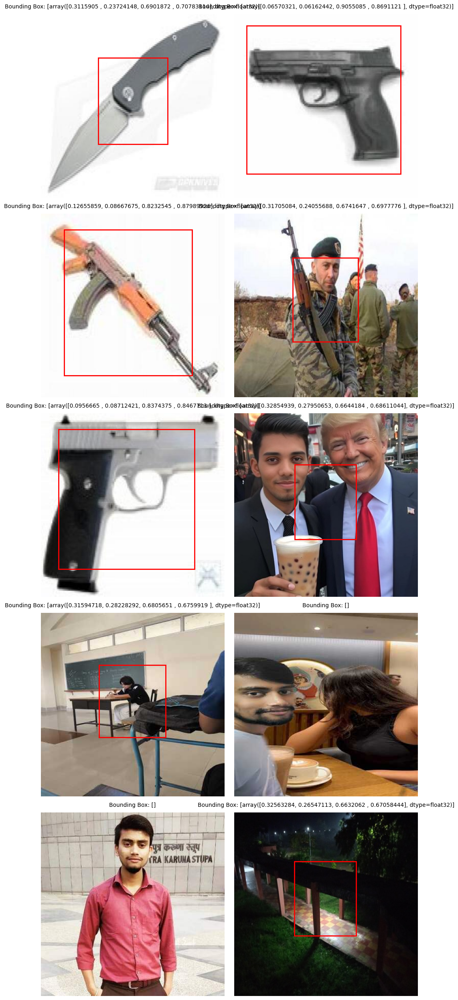

In [69]:

from tensorflow.keras.preprocessing import image as keras_image

def preprocess_image(img_path, model):
    # Load and preprocess the image to be compatible with model input shape
    img = keras_image.load_img(img_path, target_size=model.input_shape[1:3])
    img_array = keras_image.img_to_array(img)
    img_array = tf.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0  # Normalize to [0, 1]
    return img_array

def plot_image_with_boxes(ax, img_array, boxes):
    # Plot the image with bounding boxes
    ax.imshow(img_array)
    img_height, img_width = img_array.shape[:2]
    
    for box in boxes:
        xmin, ymin, xmax, ymax = box
        # If the box is normalized, denormalize it using image dimensions
        if xmin < 1 and ymin < 1 and xmax < 1 and ymax < 1:
            xmin, xmax = xmin * img_width, xmax * img_width
            ymin, ymax = ymin * img_height, ymax * img_height
        
        # Add the bounding box (red)
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   edgecolor='red', linewidth=2, fill=False))
    ax.axis('off')

def test_model_on_folder(folder_path, model, num_images=4, threshold=0.4, min_bbox_size=0.05):
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('png', 'jpg', 'jpeg'))]
    
    # Calculate number of rows needed (2 images per row)
    num_rows = (min(num_images, len(image_files)) + 1) // 2
    
    # Create a figure with subplots
    fig, axes = plt.subplots(num_rows, 2, figsize=(10, 5*num_rows))
    if num_rows == 1:
        axes = axes.reshape(1, -1)
    
    # Process each image
    for i, img_file in enumerate(image_files[:num_images]):
        if i >= num_images:
            break
            
        row = i // 2
        col = i % 2
        
        img_path = os.path.join(folder_path, img_file)
        img_array = preprocess_image(img_path, model)
        
        # Get predictions
        predictions = model.predict(img_array, verbose=0)  # Reduced verbosity
        
        # Assuming the model outputs bounding boxes in predictions[0]
        pred_boxes = predictions[0]  # Bounding box predictions
        
        # If the output format is different (e.g., a single float), adjust accordingly
        if isinstance(pred_boxes, np.ndarray) and pred_boxes.ndim == 1:
            pred_boxes = [pred_boxes]  # Wrap in a list if it's a single prediction
        
        # Debugging: Check the structure of bounding boxes
        print(f"Predicted Boxes (Processed): {pred_boxes}")
        
        # Apply threshold and determine if bounding box exists
        valid_boxes = []
        for box in pred_boxes:
            if len(box) == 4:  # Ensure each box has 4 coordinates
                xmin, ymin, xmax, ymax = box
                width = xmax - xmin
                height = ymax - ymin
                
                # Check if the bounding box size exceeds the minimum size
                if width * height > min_bbox_size:
                    valid_boxes.append(box)
        
        # If no valid boxes, skip this image
        if not valid_boxes:
            print(f"No valid bounding box found for {img_file}")
        
        # Display image with predicted boxes
        img = keras_image.load_img(img_path)
        plot_image_with_boxes(axes[row, col], np.array(img), valid_boxes)
        
        # Create detailed prediction string for the bounding box
        prediction_str = f"Bounding Box: {valid_boxes}"

        axes[row, col].set_title(prediction_str, fontsize=10, pad=10)
        
        # Print detailed results
        print(f"\nImage {i+1}: {img_file}")
        print(f"Bounding Box: {valid_boxes}")
        print("-" * 50)
    
    # Hide empty subplots if odd number of images
    if num_images % 2 != 0:
        axes[num_rows-1, 1].axis('off')
        
    # Adjust layout and display
    plt.tight_layout()
    plt.show()

# Test the model on images in a folder
folder_path = 'try/'  # Specify the path to your folder
min_bbox_size = 0.10  # Minimum size of bounding box as a fraction of the image area
test_model_on_folder(folder_path, model, num_images=10, min_bbox_size=min_bbox_size)
